In [6]:
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import Descriptors
from rdkit.Chem import rdFreeSASA
from IPython.display import display
from rdkit.Chem import PandasTools

In [7]:
def calculate_sasa(mol):
    try:
        hmol = Chem.AddHs(mol)
        AllChem.EmbedMolecule(hmol)
        radii = rdFreeSASA.classifyAtoms(hmol)
        sasa = rdFreeSASA.CalcSASA(hmol, radii)
    except:
        sasa = float('nan')
    return sasa

def calculate_qed(mol):
    qed = Descriptors.qed(mol)
    return qed

def generate(smiles, verbose=False):
    moldata = []
    for elem in smiles:
        mol = Chem.MolFromSmiles(elem)
        moldata.append(mol)

    baseData = np.arange(1, 1)
    i = 0
    for mol in moldata:
        # Generate 3D coordinates
        AllChem.EmbedMolecule(mol)

        desc_MolLogP = Descriptors.MolLogP(mol)
        desc_MolWt = Descriptors.MolWt(mol)
        desc_NumRotatableBonds = Descriptors.NumRotatableBonds(mol)
        desc_HBONDAcceptors = Chem.Lipinski.NumHDonors(mol)
        desc_HBONDDonors = Chem.Lipinski.NumHAcceptors(mol)
        desc_TPSA = Descriptors.TPSA(mol)
        desc_HeavyAtoms = Descriptors.HeavyAtomCount(mol)
        desc_NumAromaticRings = Descriptors.NumAromaticRings(mol)
        desc_QED = calculate_qed(mol)
        desc_SASA = calculate_sasa(mol)
        desc_aliphatic_chains=count_aliphatic_chains(mol)

        row = np.array([desc_MolLogP, desc_MolWt, desc_NumRotatableBonds,
                        desc_HBONDAcceptors, desc_HBONDDonors, desc_TPSA, 
                        desc_HeavyAtoms, desc_NumAromaticRings, desc_SASA, desc_QED])

        if i == 0:
            baseData = row
        else:
            baseData = np.vstack([baseData, row])
        i += 1

    columnNames = ["MolLogP", "MolWt", "NumRotatableBonds", "HBondDonors", "HBondAcceptors",
                   "TPSA", "HeavyAtoms", "NumAromaticRings", "SASA", "QED"]
    
    descriptors = pd.DataFrame(data=baseData, columns=columnNames)

    return descriptors

In [10]:
import pandas as pd

def ret_final_df(path_to_csv):
    df_orig=pd.read_csv(path_to_csv)
    smiles=df_orig['Ligand SMILES']
    df = generate(smiles)
    df_sub=df_orig[['FDA drugnames','Ligand SMILES']]
    merged_df = pd.concat([df_sub, df], axis=1)
    # Create RDKit molecules from the SMILES
    molecules = [Chem.MolFromSmiles(i) for i in smiles]

# Write molecules to an SDF file
    writer = Chem.SDWriter('molecules.sdf')
    for mol in molecules:
        writer.write(mol)
    writer.close()
    struc_df=PandasTools.LoadSDF("molecules.sdf",molColName='Structures')
    struc_df=struc_df.drop(['ID'], axis=1)
    merged_df_final = pd.concat([merged_df, struc_df], axis=1)
    return merged_df_final

In [11]:
df_final=ret_final_df("FDA_Human_2022-11-14_2.csv")

,FDA drugnames,Ligand SMILES,MolLogP,MolWt,NumRotatableBonds,HBondDonors,HBondAcceptors,TPSA,HeavyAtoms,NumAromaticRings,SASA,QED,Structures
0,BEROCCA PN; BIOTIN,OC(=O)CCCC[C@@H]1SC[C@@H]2NC(=O)N[C@H]12,0.79680,244.316,5.0,3.0,3.0,78.43,16.0,0.0,294.477271,0.493478,
1,CAPRELSA; VANDETANIB,COCc1cccc(C[C@H](O)\C=C\[C@H]2CCCC(=O)N2CCCCCCC(O)=O)c1,3.70880,417.546,13.0,2.0,4.0,87.07,30.0,1.0,591.815789,0.377381,
2,AMINOSYN 3.5% M IN PLASTIC CONTAINER; SODIUM CHLORIDE,Cc1c(\C=C\c2cc[n+](C)cc2)c2cc(C)ccc2n1C,3.79004,277.391,2.0,0.0,1.0,8.81,21.0,3.0,373.869607,0.630195,
3,AMINOSYN II 10% W/ ELECTROLYTES; POTASSIUM CHLORIDE,COc1cccc2sc(Nc3nnc(o3)-c3cccs3)nc12,4.16000,330.394,4.0,1.0,8.0,73.07,22.0,4.0,322.300323,0.605514,
4,SUNITINIB MALATE; SUNITINIB MALATE,CCN(CC)CCNC(=O)c1c(C)[nH]c(\C=C2/C(=O)Nc3ccc(F)cc23)c1C,3.33494,398.482,7.0,3.0,3.0,77.23,29.0,2.0,524.839493,0.626303,
5,LAPATINIB; LAPATINIB,CS(=O)(=O)CCNCc1ccc(o1)-c1ccc2ncnc(Nc3ccc(OCc4cccc(F)c4)c(Cl)c3)c2c1,6.13910,581.069,11.0,2.0,8.0,106.35,40.0,5.0,631.480836,0.179479,
6,LAPATINIB; LAPATINIB,CC1=CCc2c(O)n(c(O)c2C1)-c1ccc(cc1)C(=O)OCC(=O)c1ccc(C)c(C)c1,4.58994,431.488,5.0,2.0,6.0,88.76,32.0,3.0,544.007295,0.350429,
7,LAPATINIB; LAPATINIB,COCCOc1ccc(cc1)N1CCN(CC1)c1cccc(c1)-c1cc2nc(nn2c(N)n1)-c1ccco1,3.98530,511.586,8.0,1.0,10.0,107.18,38.0,5.0,593.016321,0.309536,
8,ERLOTINIB HYDROCHLORIDE; ERLOTINIB HYDROCHLORIDE,COCCOc1cc2ncnc(Nc3cccc(c3)C#C)c2cc1OCCOC,3.40510,393.443,10.0,1.0,7.0,74.73,29.0,3.0,478.020467,0.417884,
9,IRESSA; GEFITINIB,COc1cc2ncnc(Nc3ccc(F)c(Cl)c3)c2cc1OCCCN1CCOCC1,4.27560,446.910,8.0,1.0,7.0,68.74,31.0,3.0,497.381622,0.517855,

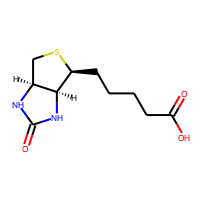
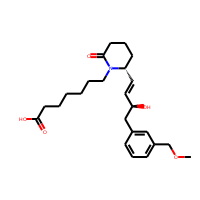
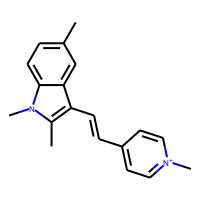
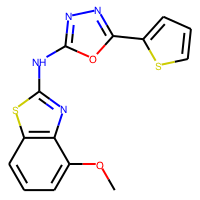
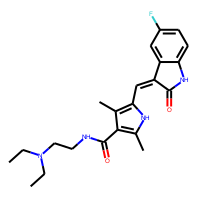
...
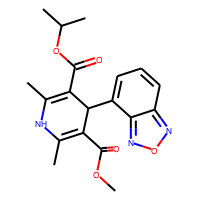
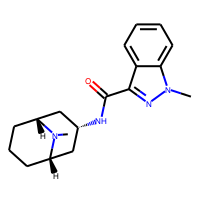
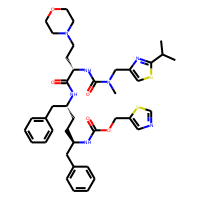
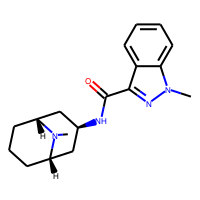
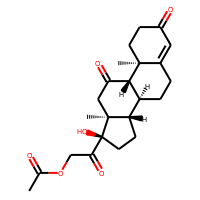

In [12]:
df_final

In [20]:
merged_df.to_excel('FDA_merged.xlsx', index=False)